In [1]:
import os
from pathlib import Path

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

In [2]:
save_path = Path("C:/Users/bruij_kn/OneDrive - Stichting Deltares/Documents/GitHub/msc-thesis/Figures/Python")

Set style

In [3]:
# plt.style.use('ggplot')

In [4]:
SMALL_SIZE = 16
MEDIUM_SIZE = 20
BIGGER_SIZE = 25

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

Load data

In [5]:
fpath = Path('./ts_datasets/storms_engelstad.csv')

df = pd.read_csv(fpath, parse_dates=['time'])

df.head()

,Unnamed: 0,time,Hs(m),Tm(s),Dm(deg),Tp(s),Dp(deg),SS(m),WL(m)
0,0,1979-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,-0.383036,-0.383036
1,1,1979-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,-0.412862,-0.412862
2,2,1979-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,-0.438796,-0.438796
3,3,1979-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,-0.467867,-0.467867
4,4,1979-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,-0.490798,-0.490798


Now compute runup.

In [6]:
# compute Beta (average slope in envelope of WL +- 2*sigma, with sigma ~= H0 / 4)
beta_f = 1/10

# compute L0
L0 = 9.81 * df['Tm(s)']**2 / (2 * np.pi)

# read in H0
H0 = df['Hs(m)']

# compute R2
df['R2(m)'] = 1.1 * (0.35 * beta_f * (H0 * L0)**0.5 + (H0 * L0 * (0.563 * beta_f**2 + 0.004))**0.5 / 2)
df['TWL(m)'] = df['R2(m)'] + df['WL(m)']

Plot

In [7]:
import hvplot
import hvplot.pandas
import holoviews as hv
# hv.help(hv.Curve)

In [48]:
t_start = pd.to_datetime("2000-01-01")
t_end = pd.to_datetime("2020-01-01")

df_masked = df[(df.time > t_start) & (df.time < t_end)]

rolling_mean = df_masked['TWL(m)'].rolling(window=48).mean().values

display(rolling_mean)

array([nan, nan, nan, ..., nan, nan, nan])

In [51]:


threshold = 0.6

curve1 = df_masked.hvplot(x='time', y=['R2(m)', 'WL(m)','TWL(m)'])
curve2 = hv.Curve(zip(df_masked.time.values, rolling_mean))

hlines = hv.HLine(threshold).opts(color='black') * hv.HLine(0).opts(color='black')

curves = curve1 * curve2 * hlines

curves.opts(width=1200)

# fig, ax = plt.subplots(figsize=(10, 5))

# ax.plot(df.time, df['R2(m)'], label='R2', alpha=0.3)
# ax.plot(df.time, df['WL(m)'], label='WL', alpha=0.3)
# ax.plot(df.time, df['R2(m)'] + df['WL(m)'], label='R2 + WL')

# ax.axhline(2, c='r', ls='--', label='threshold')

# ax.set_xlim((t_start, t_end))
# ax.legend()

:Overlay
   .NdOverlay.I :NdOverlay   [Variable]
      :Curve   [time]   (value)
   .Curve.I     :Curve   [x]   (y)
   .HLine.I     :HLine   [x,y]
   .HLine.II    :HLine   [x,y]

- Plot rolling mean
- I guess we want like three storms in there per year?

In [13]:
# plt.plot(df.time, df['Hs(m)'])

# plt.xlim((t_start, t_end))

Let's try a threshold of 2m.

In [19]:
thresholds = np.arange(0.5, 1.5, 0.1)  # [m]

In [20]:
df['TWL(m)'] = df['R2(m)'].values + df['WL(m)'].values

for th in thresholds:
    df[f'# exceeded ({th:.2f})'] = df['TWL(m)'] > th

df['year'] = df['time'].dt.year
df_sums = df.groupby('year').sum('exceeded?').drop(['Unnamed: 0', 'Hs(m)', 'Tm(s)', 'Dm(deg)', 'Tp(s)', 'Dp(deg)', 'SS(m)', 'WL(m)', 'R2(m)', 'TWL(m)'], axis=1)
display(df_sums)

,# exceeded (0.80),# exceeded (0.90),# exceeded (1.00),# exceeded (1.10),# exceeded (1.20),# exceeded (1.30),# exceeded (1.40),# exceeded (1.50),# exceeded (1.60),# exceeded (1.70),# exceeded (1.80),# exceeded (1.90),# exceeded (0.50),# exceeded (0.60),# exceeded (0.70)
year,,,,,,,,,,,,,,,
1979,12,1,0,0,0,0,0,0,0,0,0,0,355,159,43
1980,99,62,32,22,17,10,0,0,0,0,0,0,398,209,137
1981,111,81,51,26,12,7,0,0,0,0,0,0,338,223,154
1982,22,6,0,0,0,0,0,0,0,0,0,0,225,101,45
1983,16,14,10,7,2,0,0,0,0,0,0,0,87,38,23
1984,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0
1985,55,54,53,48,42,35,15,7,3,0,0,0,79,60,56
1986,82,57,39,28,10,5,4,3,1,0,0,0,323,200,127
1987,145,87,37,13,5,0,0,0,0,0,0,0,771,424,219


C:\Users\bruij_kn\AppData\Local\Temp\ipykernel_18120\3066014830.py:36: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


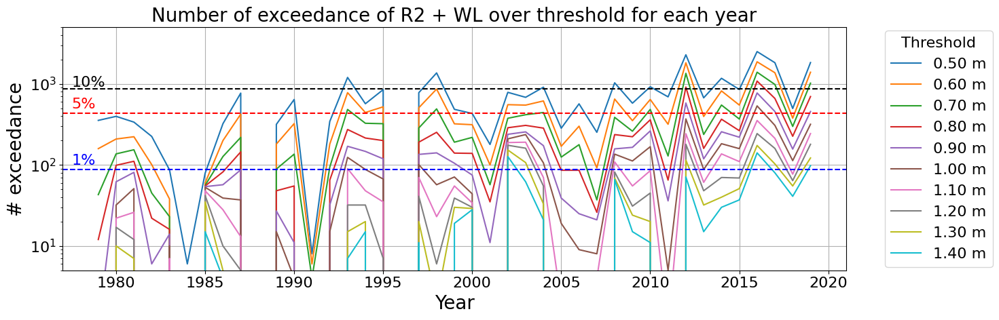

In [38]:
fig, ax = plt.subplots(figsize=(15,5))

for th in thresholds:
    ax.plot(df_sums.index, df_sums[f'# exceeded ({th:.2f})'], label=f'{th:.2f} m')

ax.set_xlabel('Year')
ax.set_ylabel('# exceedance')

ax.grid()
ax.set_title('Number of exceedance of R2 + WL over threshold for each year')

ax.set_ylim((5, 5000))

ax.axhline(876, color='k', ls='--')
ax.axhline(438, color='r', ls='--')
ax.axhline(87.6, color='b', ls='--')

ax.annotate("1%", (1977.5, 87.6), (1977.5, 100), color='b',
            # arrowprops={'width':2, 'headwidth':4, 'headlength':4, 'color':'red'}
            )
ax.annotate("5%", (1977.5, 486), (1977.5, 500), color='r',
            # arrowprops={'width':2, 'headwidth':4, 'headlength':4, 'color':'red'}
            )
ax.annotate("10%", (1977.5, 876), (1977.5, 920), color='k', 
            # arrowprops={'width':2, 'headwidth':4, 'headlength':4, 'color':'red'}
            )

ax.set_yscale('log')

ax.legend(title='Threshold', bbox_to_anchor=(1.04, 0.5), loc="center left")

fig.tight_layout()

fname  = 'R2_threshold.png'

fig.show()

fig.savefig(os.path.join(save_path, 'rmse_calibration.png'), bbox_inches='tight', facecolor='white', transparent=False)

It seems that 1m is fine. Let's make a nice histogram plot for the year 2009, and also a figure which visualizes the number of storms for that year through the rolling mean.